# Вступление

**Поиск изображений по запросу**

**Цель иследования:**

- разработать демонстрационную версию поиска изображений по запросу

**Ход исследования**

1. Загрузка  данных и и сследовательский анализ
2. Подготовка данных к обучению модели
3. Обучение модели
4. Тестирование модели и демонстрация ее работы
5. Общий вывод по работе

**Что важно учесть при выполнении проекта**

1. описать найденные в данных проблемы,
2. применить четкую  структуру проекта и придерживаться хорошего стиля при написании кода,
3. обозначить выводы по этапам,
4. кратко комментировать шаги,
5. использовать сводные таблицы для вывода данных,

# Исследовательский анализ данных

Данные содержат экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи нужно агрегировать их — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберем либо одну из них, либо объединим их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

Подготовка данных для анализа называется предобработкой. Нужно оценить масштаб найденных проблем и устранить их. Предобработка следует принципу GIGO
(от англ. garbage in — garbage out, буквально «мусор на входе — мусор на выходе»). Это значит, что при ошибках во входных данных даже правильный алгоритм работы приведёт к неверным результатам. Так же нужно помнить об законе экономии, который называется Бритва О́ккама. В нем говорится следующее: Не следует множить сущее без необходимости. Суть принципа: совершенство должно быть простым. Если какого-то результата можно достичь с привлечением сущностей A, B и C либо другим путём с привлечением A, B, С и D — надо выбирать первый путь. В плане программирования это значит, что не следует создавать промежуточные переменные, которые не пригодятся в дальнейшем.

## Загрузка данных

In [1]:
!pip3 install requests -q
!pip3 install optuna -q
!pip3 install tensorflow -q
!pip3 install tqdm -q
!pip3 install lightgbm -q
!pip3 install nltk -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 12.2 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import numpy as np
import requests
import zipfile
import io
import re
import matplotlib.pyplot as plt
from sklearn.model_selection import (
    train_test_split,
    cross_val_score,
    GridSearchCV,
    GroupShuffleSplit
)
from sklearn.metrics import root_mean_squared_error, accuracy_score
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.pipeline import Pipeline
from tensorflow.keras.models import Sequential, load_model, Model
from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    Flatten,
    Dense,
    Dropout
)
from tensorflow.keras.layers import Dropout as dr
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator, 
    load_img, 
    img_to_array
)
from keras.applications.resnet50 import ResNet50, preprocess_input
import scipy.sparse
from scipy.sparse import hstack
import spacy as sp
from nltk.corpus import stopwords as nltk_stopwords
from concurrent.futures import ProcessPoolExecutor
import lightgbm as lgb
from tqdm import tqdm
import warnings
import os
import random
from functools import lru_cache
from transformers import AutoTokenizer, AutoModel
import torch
from PIL import Image
from pathlib import Path
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

# Вывод всех столбцов и строк, независимо от их количества.
pd.set_option('display.max_columns', None)

In [3]:
# URL ZIP-архива
url = 'https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip'

# Скачивание архива
response = requests.get(url)
response.raise_for_status()

with io.BytesIO(response.content) as bytes_io:
    with zipfile.ZipFile(bytes_io) as z:
        # Распаковка
        z.extractall('/content/')
        # Переменные для хранения данных
        for filename in z.namelist():
            if filename.startswith('to_upload/'):
                base_name = filename.split('/')[-1]
                with z.open(filename) as file:
                    if base_name == 'CrowdAnnotations.tsv':
                        crow = pd.read_csv(
                            file,
                            sep='\t',
                            names=[
                                'image', 
                                'query_id', 
                                'perc_match', 
                                'count_match', 
                                'count_not_match'
                            ],
                            header=None
                        )
                    elif base_name == 'ExpertAnnotations.tsv':
                        expert = pd.read_csv(
                            file,
                            sep='\t',
                            names=[
                                'image', 
                                'query_id', 
                                'first_grade', 
                                'second_grade', 
                                'third_grade'
                            ],
                            header=None
                        )
                    elif base_name == 'test_images.csv':
                        test_images = pd.read_csv(file)
                    elif base_name == 'test_queries.csv':
                        test_queries = pd.read_csv(file, sep='|')
                    elif base_name == 'train_dataset.csv':
                        train_dataset = pd.read_csv(file)

In [4]:
# Вывод первых строк каждого файла
print('CrowdAnnotations')
display(crow.head())

print('ExpertAnnotations')
display(expert.head())

print('test_images')
display(test_images.head())

print('test_queries')
display(test_queries.head())

print('train_dataset')
display(train_dataset.head())

CrowdAnnotations


,image,query_id,perc_match,count_match,count_not_match
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


ExpertAnnotations


,image,query_id,first_grade,second_grade,third_grade
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


test_images


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


test_queries


,Unnamed: 0,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


train_dataset


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


## Соответствие техническому описанию

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>
    
Признаковое описание для таблиц:



`CrowdAnnotations` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга.

- 0 (image) - имя изображения
- 1 (query_id) - идентификатор описания, имеет формат: `<имя файла изображения>#<порядковый номер описания>`
- 2 (perc_match) - Доля людей, подтвердивших, что описание соответствует изображению
- 3 (count_match) - Количество человек, подтвердивших, что описание соответствует изображению
- 4 (count_not_match) - Количество человек, подтвердивших, что описание не соответствует изображению


`ExpertAnnotations` — данные по соответствию изображения и описания, полученные в результате опроса экспертов. Эксперты ставят оценки по шкале от 1 до 4, где:
- 1 — изображение и запрос совершенно не соответствуют друг другу,
- 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует,
- 3 — запрос и текст соответствуют с точностью до некоторых деталей,
- 4 — запрос и текст соответствуют полностью.

Признаки:

- 0 (image) — имя изображения
- 1 (query_id) — идентификатор описания, имеет формат: `<имя файла изображения>#<порядковый номер описания>`
- 2 (first_grade) — оценки трёх экспертов
- 3 (second_grade) — оценки трёх экспертов
- 4 (third_grade) — оценки трёх экспертов

`test_images` — информация, необходимая для тестирования

- image - имя изображения

`test_queries` — информация, необходимая для тестирования. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

- query_id - идентификатор описания, имеет формат: `<имя файла изображения>#<порядковый номер описания>`
- query_text — текст запроса
- image - имя релевантного изображения

`train_dataset.csv` — информация, необходимая для обучения. Для одной картинки может быть доступно до 5 описаний

- image - имя изображения
- query_id - идентификатор описания, имеет формат: `<имя файла изображения>#<порядковый номер описания>`
- query_text — текст описания

Содержание архива:

`train_images` — в папке содержатся изображения для тренировки модели

`test_images` — в папке содержатся изображения для тестирования модели

In [6]:
# Вывод информации
print('CrowdAnnotations')
info(crow)

print('ExpertAnnotations')
info(expert)

print('test_images')
info(test_images)

print('test_queries')
info(test_queries)

print('train_dataset')
info(train_dataset)

CrowdAnnotations
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            47830 non-null  object 
 1   query_id         47830 non-null  object 
 2   perc_match       47830 non-null  float64
 3   count_match      47830 non-null  int64  
 4   count_not_match  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,image,query_id,perc_match,count_match,count_not_match
31277,3348385580_10b53391f9.jpg,3044536048_e615466e7f.jpg#2,0.0,0,3
26064,3155987659_b9ea318dd3.jpg,3384314832_dffc944152.jpg#2,0.0,0,3
562,113678030_87a6a6e42e.jpg,3228069008_edb2961fc4.jpg#2,0.0,0,3
40880,3697359692_8a5cdbe4fe.jpg,2735558076_0d7bbc18fc.jpg#2,0.0,0,3
13360,2525270674_4ab536e7ec.jpg,2414397449_2ac3b78e0d.jpg#2,0.0,0,3


ExpertAnnotations
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image         5822 non-null   object
 1   query_id      5822 non-null   object
 2   first_grade   5822 non-null   int64 
 3   second_grade  5822 non-null   int64 
 4   third_grade   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


,image,query_id,first_grade,second_grade,third_grade
4512,3545652636_0746537307.jpg,3613955682_3860e116cf.jpg#2,2,2,3
3546,3246991821_750a3097e2.jpg,2901074943_041aba4607.jpg#2,2,2,2
5063,387830531_e89c192b92.jpg,2339106348_2df90aa6a9.jpg#2,1,1,1
4195,3462454965_a481809cea.jpg,359837950_9e22ffe6c2.jpg#2,2,2,2
3442,3222055946_45f7293bb2.jpg,2251747182_6b67a3ab8b.jpg#2,2,3,3


test_images
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


,image
48,2308256827_3c0a7d514d.jpg
63,191003283_992257f835.jpg
56,782401952_5bc5d3413a.jpg
39,381514859_b40418d9c3.jpg
98,2670637584_d96efb8afa.jpg


test_queries
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB


,Unnamed: 0,query_id,query_text,image
458,458,634891010_9fa189effb.jpg#3,Two dogs are shaking themselves dry on the pat...,634891010_9fa189effb.jpg
308,308,3386953179_84c2d7922f.jpg#3,a snowboarder wearing red is descending a snow...,3386953179_84c2d7922f.jpg
472,472,862156271_3eacea90a8.jpg#2,Two girls walking next to each other and talki...,862156271_3eacea90a8.jpg
459,459,634891010_9fa189effb.jpg#4,Two dogs are shaking water off .,634891010_9fa189effb.jpg
57,57,2060031241_a3ae7a06bb.jpg#2,A little kid holds up a remote control in fron...,2060031241_a3ae7a06bb.jpg


train_dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
5289,2663794355_e726ec7e05.jpg,1456393634_74022d9056.jpg#2,A child doing a handstand on the beach .
4792,421730441_6b2267fd31.jpg,241346508_0b3907a95b.jpg#2,The football players in red are attempting a p...
5764,3567061016_62768dcce1.jpg,464251704_b0f0c4c87a.jpg#2,A girl is swinging and looking down with her h...
3079,1808370027_2088394eb4.jpg,3461041826_0e24cdf597.jpg#2,A black and white dog is splashing in a stream .
5560,2991994415_504d1c0a03.jpg,2041867793_552819a40b.jpg#2,A young child wearing a mask at Ivars .


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>
    
Данные выглядят адекватно, пропусков нет.

In [7]:
print('Количество уникальных изображений в тренировочном фрейме:',\ 
      train_dataset.image.nunique())
print('Количество уникальных изображений в тестовом фрейме:',\
      test_images.image.nunique())

Количество уникальных изображений в тренировочном фрейме: 1000
Количество уникальных изображений в тестовом фрейме: 100


In [8]:
print('Количество уникальных запросов в тренировочном фрейме:',\
      train_dataset.query_text.nunique())
print('Количество уникальных запросов в тестовом фрейме:',\
      test_queries.query_text.nunique())

Количество уникальных запросов в тренировочном фрейме: 977
Количество уникальных запросов в тестовом фрейме: 500


In [9]:
# Сводные таблицы количества оценок для источников доверия
print('Экспертные оценки')
(pd.concat([
    # Группировка и определение количества оценок каждого из экспертов
    expert.groupby('first_grade').size().rename('Первый эксперт'),
    expert.groupby('second_grade').size().rename('Второй эксперт'),
    expert.groupby('third_grade').size().rename('Третий эксперт')
], axis=1)
.rename_axis(index='Тип оценки'))

Экспертные оценки


,Первый эксперт,Второй эксперт,Третий эксперт
Тип оценки,,,
1,4120,3327,2350
2,1109,1666,2222
3,346,518,837
4,247,311,413


In [10]:
print('Краудсординговые оценки')
crow.perc_match.value_counts()

Краудсординговые оценки


,count
perc_match,
0.000000,41970
0.333333,3000
0.666667,1360
1.000000,1323
0.250000,96
0.500000,27
0.200000,22
0.750000,9
0.600000,8


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>
    
Экспертные оценки представляют из себя значения от 1 до 4, краудсординговые - это значения в диапазоне от 0 до 1. Оценки соответствуют признаковому описанию.

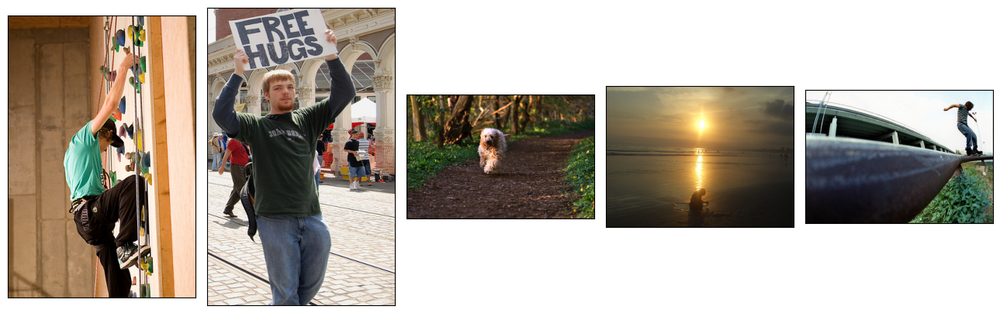

In [11]:
# Просмотр тренировочных изображений
# Размер фигуры (ширина 13 дюймов, высота 13 дюймов)
fig = plt.figure(figsize=(13,13))

# Цикл итерации в диапазоне от 0 до 4
for i in range(5):
    # Новое окно-подграфик к общей фигуре
    # (1 ряд, 5 окон, номер окна начинается с 1)
    fig.add_subplot(1, 5, i+1)
    image = Image.open(Path(
        # Базовая папка
        '/content/to_upload/',
        # Набор изображений
        'train_images',
        # Случайный список из 5 изображений и берём i-е изображение
        list(train_dataset['image'].sample(5))[i]))

    # Изображение на экране
    plt.imshow(image)

    # Исключение отметок по осям
    plt.xticks([])
    plt.yticks([])

    # Оптимальное размещение элементов на странице
    plt.tight_layout()

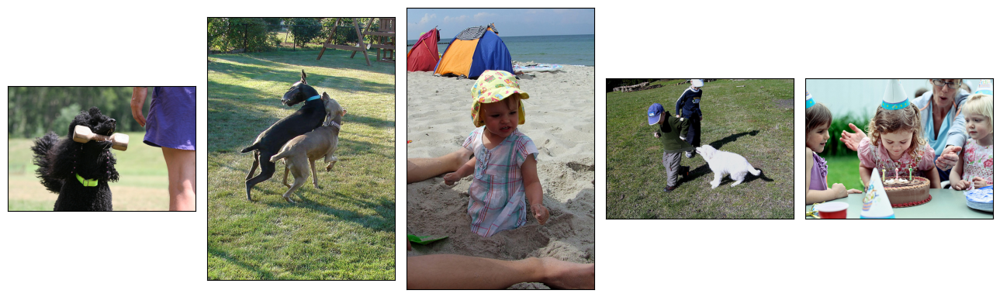

In [12]:
# Просмотр тестовых изображений
fig = plt.figure(figsize=(13,13))

for i in range(5):
    fig.add_subplot(1, 5, i+1)
    image = Image.open(Path(
        '/content/to_upload/',
        'test_images',
        list(test_images['image'].sample(5))[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>
    
Просмотрев данные сделаем выводы:

1. Количество изображений по выборкам 1 к 10
2. Количество запросов примерно 1 к 2
3. Распределение оценок по источникам. У экспертов полное не соответствие запроса изображению примерно от 2350 до 4120 случаев, полное соответствие - от 247 до 413. У краудсординга с оценками по лучше и полное соответствие в 1323 случаях, полное не соответствие - 41970.
4. Картинки различного формата, часто встречаются изображения с детьми.

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Следуя заданию агрегируем оценки тоблицы `expert` из трех в одну методом голосования большинства. За какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Если нет одинаковых оценок, ставим пропуск.

In [13]:
# Функция для голосования большинства
def expert_assessment(row):
    grades = [row['first_grade'], row['second_grade'], row['third_grade']]
    # Частота
    counts = pd.Series(grades).value_counts()
    # Поиск оценок с количеством >=2
    majority = counts[counts >= 2]
    if len(majority) == 1:
        # Есть единственная оценка с большинством
        return majority.index[0]
    else:
        # Нет явного большинства
        return None

# Приминение функции и создание нового столбца
expert['grade'] = expert.apply(expert_assessment, axis=1)

In [14]:
# Проверка резульата
expert.grade.value_counts()

,count
grade,
1.0,3327
2.0,1566
3.0,492
4.0,311


In [15]:
# Проверка резульата
expert.isna().sum()

,0
image,0
query_id,0
first_grade,0
second_grade,0
third_grade,0
grade,126


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

В результате голосования образовалось 126 пропусков. Далее удалим лишние столбцы `first_grade, second_grade, third_grade`.

In [16]:
# Выбор только нужных столбцов
expert = expert[['image', 'query_id', 'grade']]

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Учитывая доверие к разным источникам оценки объединим экспертные и краудсординговые оценки. Для краудсординговых оценок уже есть доля подтверждающих соответствие в столбце `perc_match`, используем их на прямую. Если доля людей, подтвердивших, что описание соответствует изображению равна 1, то вес `weight_crow` равен 0.4. В другом случае 0

Для экспертных мнений на основе полученных оценок в столбце `grade` выделим вес `weight_exp` следующим образом. Если экспертная оценка 0 — вес принимает значение 0, если оценка 1 — вес принимает значение 0.33 и так далее.

$$\text{weight}\left(\frac{g-1}{3}\right) =
\begin{cases}
0 & \text{если } g=1 \\
0.33 & \text{если } g=2 \\
0.66 & \text{если } g=3 \\
1 & \text{если } g=4
\end{cases}$$

In [17]:
# Использование лямбда функции для фрейма экспертов
expert['weight_exp'] = expert['grade'].apply(
    lambda x: 0 if x == 1 else 0.33 if x == 2 else 0.66 if x == 3 else 1
)

/tmp/ipython-input-17-2417560913.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  expert['weight_exp'] = expert['grade'].apply(


In [18]:
# Баланс весов
expert['weight_exp'].value_counts()

,count
weight_exp,
0.00,3327
0.33,1566
0.66,492
1.00,437


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Объединим фреймы с оценками по столбцам `image` и `query_id` используя `pd.merge()` с сохранением строк из фрейма `expert` и `crow`, так как нужно учесть доверие всех источников.

In [19]:
crow_exp_match = pd.merge(expert, crow, on=['image', 'query_id'], how='outer')
crow_exp_match.sample(5)

,image,query_id,grade,weight_exp,perc_match,count_match,count_not_match
14713,2534502836_7a75305655.jpg,3462454965_a481809cea.jpg#2,NaN,NaN,0.000000,0.0,3.0
42800,3642220260_3aa8a52670.jpg,3642220260_3aa8a52670.jpg#2,NaN,NaN,1.000000,3.0,0.0
41918,3609032038_005c789f64.jpg,3484649669_7bfe62080b.jpg#2,1.0,0.00,NaN,NaN,NaN
8931,224369028_b1ac40d1fa.jpg,2559503010_84f20b3bc9.jpg#2,NaN,NaN,0.000000,0.0,3.0
45375,416788726_5b4eb1466e.jpg,2575647360_f5de38c751.jpg#2,3.0,0.66,0.333333,1.0,2.0


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Теперь создадим целевую переменную `match` на основе столбца `weight_exp` с заполнением образовавшихся пропусков при объединении данными из столбца `perc_match`

In [20]:
crow_exp_match['match'] = round(
    crow_exp_match['weight_exp']
    .fillna(crow_exp_match['perc_match']), 
    2
)
crow_exp_match.sample(5)

,image,query_id,grade,weight_exp,perc_match,count_match,count_not_match,match
37252,3472364264_dbde5a8d0a.jpg,2933912528_52b05f84a1.jpg#2,NaN,NaN,0.333333,1.0,2.0,0.33
39892,3549583146_3e8bb2f7e9.jpg,2207244634_1db1a1890b.jpg#2,NaN,NaN,0.000000,0.0,3.0,0.00
15091,2553550034_5901aa9d6c.jpg,3224227640_31865b3651.jpg#2,NaN,NaN,0.000000,0.0,3.0,0.00
24705,3030566410_393c36a6c5.jpg,2501595799_6316001e89.jpg#2,NaN,NaN,0.000000,0.0,3.0,0.00
14392,2525270674_4ab536e7ec.jpg,327415627_6313d32a64.jpg#2,NaN,NaN,0.000000,0.0,3.0,0.00


In [21]:
# Количество пропусков в целевой переменной
crow_exp_match.isna().sum()

,0
image,0
query_id,0
grade,45627
weight_exp,45501
perc_match,3493
count_match,3493
count_not_match,3493
match,0


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Проверим распределение оценок и удалим лишний столбец в таблице `test_queries`

In [22]:
# Баланс весов
crow_exp_match['match'].value_counts()

,count
match,
0.00,43664
0.33,4309
1.00,1497
0.67,1202
0.66,492
0.25,90
0.50,23
0.20,20
0.60,8


In [23]:
test_queries = test_queries.drop('Unnamed: 0', axis=1)

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Создадим копии основных фреймов для сохраненния исходных данных. Следующим этапом объединим фрейм с оценками `crow_exp_match` и тренировочные данные `train_dataset` по столбцам `image` и `query_id`.

In [24]:
# Объединение с охранением срок тренировочной выборки
train = train_dataset.copy()
test = test_queries.copy()
train = (
    pd.merge(train, crow_exp_match, on=['image', 'query_id'], how='left')
)

In [25]:
# Количество пропусков в целевой переменной
train.isna().sum()

,0
image,0
query_id,0
query_text,0
grade,126
weight_exp,0
perc_match,3493
count_match,3493
count_not_match,3493
match,0


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Визуализируем распределение оценок

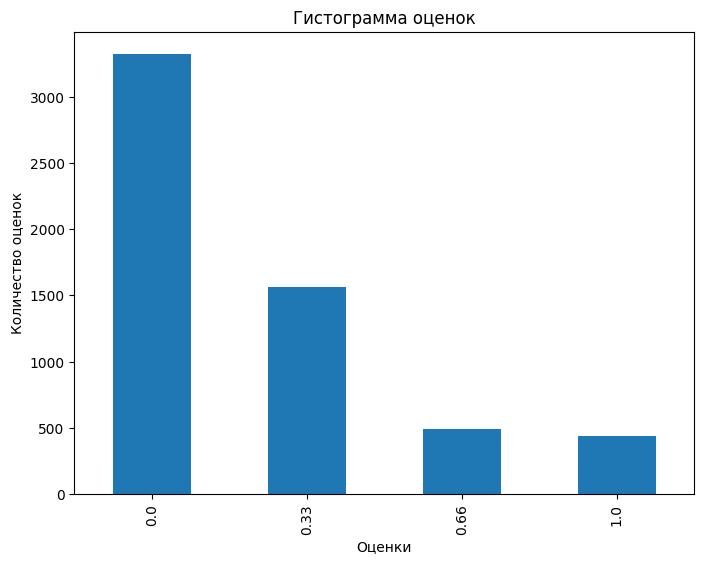

In [26]:
plt.figure(figsize=(8, 6))
train['match'].value_counts().plot(kind='bar')
plt.title('Гистограмма оценок')
plt.xlabel('Оценки')
plt.ylabel('Количество оценок')
plt.show()

# Подготовка данных к обучению модели

В некоторых странах, где работает компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Создадим мешок слов, относящиеся к детям до 16 лет для дальнейшего исключения из обучающего датасета пар, которые, могут попадать под юридические ограничения.

In [27]:
bag_word_lim = pd.Series(
    [
        'child',
        'children',
        'kid',
        'kids',
        'toddler',
        'toddlers',
        'infant',
        'infants',
        'baby',
        'babies',
        'preteen',
        'preteens',
        'teenager',
        'teenagers',
        'teen',
        'teens',
        'adolescent',
        'adolescents',
        'youth',
        'youths',
        'juvenile',
        'juveniles',
        'youngster',
        'youngsters',
        'school-age child',
        'school-age children',
        'schoolboy',
        'schoolboys',
        'schoolgirl',
        'schoolgirls',
        'elementary school student',
        'elementary school students',
        'middle school student',
        'middle school students',
        'high school student',
        'high school students',
        'pre-adolescent',
        'pre-adolescents',
        'puberty',
        'minor',
        'minors',
        'juvenile',
        'juveniles',
        'baby shower',
        'playground',
        'playgrounds',
        'kindergarten class',
        'kindergarten classes',
        'preschool activity',
        'preschool activities',
        'youth sports',
        'youth sport',
        'teenagers',
        'family',
        'families'
            ]
)

## Векторизация текстов

Следующий этап — векторизация текстов. Исключим из обучающего датасета пары, которые, исходя из подготовленного списка слов, могут попадать под юридические ограничения.

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Чтобы дальше двигать в проекте необходимо лемматизировать всю текстовую информацию, мешок с словами юридических ограничений, тренировочный фрейм с помощью библиотеки `SpaCy`

In [28]:
# Функция для лемматизации
nlp = sp.load('en_core_web_sm', disable=['parser', 'ner'])

def lemmatize_text(text):
    doc = nlp(text)
    return " ".join([token.lemma_ for token in doc if token.is_alpha])

In [29]:
# ProcessPoolExecutor для параллельной обработки лемматизации
with ProcessPoolExecutor() as executor:
    train['clear_query_text'] = list(
        executor
        .map(lemmatize_text, train['query_text'])
    )
    test['clear_query_text'] = list(
        executor
        .map(lemmatize_text, test['query_text'])
    )

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Теперь очистим тренировочный датасет от фотографий, попадающих под юридические ограничения

In [30]:
# Функция, которая проверяет наличие хотя бы одного
# слова из списка bag_word_lim в переданном тексте
def contains_forbidden_word(text, bag_word_lim):
    # Текст в строку и к нижнему регистру
    for word in bag_word_lim:
        # Регулярное выражение для поиска целого слова (\b для границ слова)
        pattern = r'\b' + re.escape(word.lower()) + r'\b'
        # Совпадение в тексте с помощью регулярного выражения
        if re.search(pattern, text):
            # Если найдено хотя бы одно слово из списка, возврат True
            return True
    # Если ни одно слово не найдено, возврат False
    return False

# Булева маска: для каждого текста в столбце 
# 'clear_query_text' приминение функции,
# которая возвращает True, если в тексте есть хотя бы одно запрещенное слово
mask_train = (
    train['clear_query_text']
    .apply(lambda x: contains_forbidden_word(x, bag_word_lim))
)

# Фильтрация DataFrame: только те строки, где mask == False
# и сброс индексов после фильтрации
train = train[~mask_train].reset_index(drop=True)

In [31]:
print('Очищенные данные:', len(train))
print('Исходные данные:', len(train_dataset))

Очищенные данные: 5241
Исходные данные: 5822


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

В тренировочных данных под очистку попало 581 изображение. Следующий этап — векторизация текстов. Применим метод `BERT`

In [32]:
# Импорт класса AutoTokenizer и токенизатор для модели 'bert-base-uncased'
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')

# Импорт класса AutoModel и предобученную модель BERT
model = AutoModel.from_pretrained('bert-base-uncased')

# Функция get_vector_text с использованием кеширования результатов 
# для ускорения повторных вызовов
@lru_cache(maxsize=None)
def get_vector_text(text, model=model, tokenizer=tokenizer):
    # Токенизация входного текста:
    # - padding=True: паддинг до max_length
    # - truncation=True: обрезка текста, если он длиннее max_length
    # - max_length=64: максимальная длина последовательности токенов
    # - return_tensors='pt': возвращает тензоры PyTorch
    token = tokenizer(
        text, 
        padding=True, 
        truncation=True, 
        max_length=64, 
        return_tensors='pt'
    )

    # Модель в режим оценки
    model.eval()

    # Отключение вычисления градиентов для ускорения и экономии памяти
    with torch.no_grad():
        # Токенизированный вход в модель и выходные данные
        model_output = model(**token)

    # Извлечение пуллерного слоя
    embedding = model_output.pooler_output

    # Возврат первого элемента батча (так как у нас один текст), 
    # преобразованный в NumPy массив
    return (embedding)[0].numpy()

# Функция get_vector_text к каждому элементу столбца 
# 'query_text' датафрейма df_train,
# и новый столбец 'text_vector' с эмбеддингами текста
train['text_vector'] = train['query_text'].apply(get_vector_text)
test['text_vector'] = test['query_text'].apply(get_vector_text)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [33]:
print('Длина эмбеддинга (плотного вектора) train:',\
      len(list(train['text_vector'].iloc[50])))
print('Длина эмбеддинга (плотного вектора) test:',\
      len(list(test['text_vector'].iloc[50])))

Длина эмбеддинга (плотного вектора) train: 768
Длина эмбеддинга (плотного вектора) test: 768


## Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-50, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Для векторизации изображений используем сверточную сеть `ResNet50`, предварительно обученную на наборе данных `ImageNet` с отключенными полносвязными слоямим по предсказанию

In [34]:
# Объект ImageDataGenerator для аугментации и пред. обработки изображений
train_datagen = ImageDataGenerator(
    # Масштабирование пикселей изображений в диапазон, 
    # подходящий для модели
    preprocessing_function=preprocess_input
)

# Генератор данных из DataFrame
train_gen_flow = train_datagen.flow_from_dataframe(
    # Передача DataFrame с данными о изображениях и метках
    dataframe=train,
    directory='/content/to_upload/train_images/',
    # Название столбца в DataFrame
    x_col='image',
    # Название столбца с метками
    y_col='match',
    # Размер изображений после изменения
    target_size=(224, 224),
    # Размер пакета данных (сколько изображений будет подаваться за один раз)
    batch_size=32,
    # Режим определения меток: 'raw' означает, 
    # что метки передаются как есть (например, числа или строки)
    class_mode='raw',
    # Этот генератор используется для обучающей части данных 
    # (выделенной из validation_split)
    subset='training',
    # бЕЗ перемешиваниЯ данных, чтобы порядок изображений оставался неизменным 
    # (важно для предсказаний)
    shuffle=False,
    # УвоспроизводимостЬ случайных процессов при разделении данных
    seed=12345
)

Found 5241 validated image filenames.


In [35]:
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_gen_flow = test_datagen.flow_from_dataframe(
    dataframe=test_images,
    directory='/content/to_upload/test_images/',
    x_col='image',
    target_size=(224, 224),
    batch_size=32,
    # метки не нужны для тестовых данных (только для предсказаний)
    class_mode=None,
    shuffle=False,
    seed=12345
)

Found 100 validated image filenames.


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Проверим корректно ли загрузились изображения

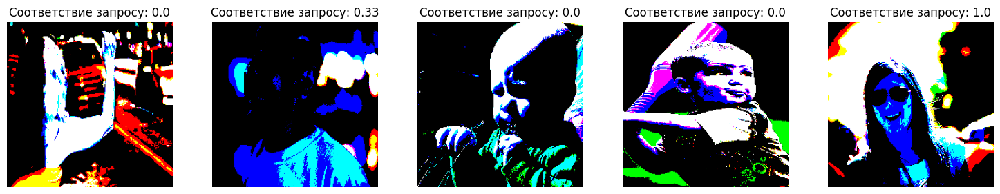

In [36]:
# Пследующий батч данных из генератора train_gen_flow
images, labels_batch = next(train_gen_flow)
# Первые 5 изображений из батча
images = images[:5]
# Соответствующие метки для этих изображений
labels_batch = labels_batch[:5]

# Фигура для отображения изображений с заданным размером
plt.figure(figsize=(15, 8))
# Первые 15 изображениям
for i in range(5):
    plt.subplot(3, 5, i + 1)
    plt.imshow(images[i])
    # Заголовок с меткой, которая соответствует запросу (класс или значение)
    plt.title(f'Соответствие запросу: {labels_batch[i]}')
    # Без осей
    plt.axis('off')
plt.tight_layout()
plt.show()

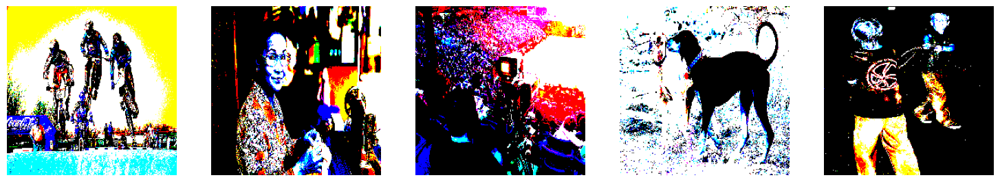

In [37]:
images = next(test_gen_flow)
images = images[:5]
labels_batch = labels_batch[:5]

plt.figure(figsize=(15, 8))
for i in range(5):
    plt.subplot(3, 5, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Изображения загрузились корректно, далее используем `ResNet50` для получения векторов изображений

In [38]:
def create_image_vectors(
    train_df, 
    generator, 
    label_column='match', 
    vector_column='image_vector'
):
    """
    Выполняет извлечение признаков изображений с помощью предобученной ResNet50
    и добавляет их в DataFrame как новый столбец.

    Parameters:
        train_df (pd.DataFrame): исходный DataFrame с данными.
        generator: глобальный генератор, настроенный на train_df.
        label_column (str): название столбца с метками.
        vector_column (str): название нового столбца для векторов признаков.

    Возвращает:
        pd.DataFrame: обновленный DataFrame с добавленным столбцом 'image_vector'.
    """
    # Модель ResNet50 без верхних слоёв (классификационных), 
    # с глобальным усреднением признаков
    base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

    # Список для хранения извлеченных признаков
    features = []

    # Общее количество образцов из исходного DataFrame
    total_samples = len(train_df)

    # Размер батча из настроек генератора
    batch_size = generator.batch_size

    # Итерация по всему набору данных батчами
    for i in range(int(np.ceil(total_samples / batch_size))):
        # Следующий батч изображений и меток из генератора
        batch_images, i = next(generator)

        # Предобработка изображений для модели ResNet50 (нормализация)
        batch_images = preprocess_input(batch_images)

        # Признаки для текущего батча изображений через модель
        batch_features = base_model.predict(batch_images)

        # Полученные признаки в список
        features.append(batch_features)

        # Проверка, достигли ли мы конца данных 
        # (по количеству обработанных изображений)
        if len(features) * batch_size >= total_samples:
            # Выход из цикла, если все изображения обработаны
            break 

    # Объединение всех собранныех признаки в один массив 
    # (размером [число изображений, размер признака])
    X = np.vstack(features)

    # Проверка, что количество извлеченных признаков 
    # совпадает с количеством строк в DataFrame
    if X.shape[0] != len(train_df):
        raise ValueError('Количество извлеченных признаков не\
        совпадает с количеством строк DataFrame.')

    # Копия исходного DataFrame, чтобы не изменять оригинал
    train_df = train_df.copy()

    # Новый столбец с векторами признаков 
    # (каждый элемент — массив признаков для изображения)
    train_df[vector_column] = list(X)

    # Обновленный DataFrame
    return train_df

In [45]:
# Векторизация тренировочных изображений
train = create_image_vectors(train, train_gen_flow)

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s

In [47]:
print('Размерность векоризованного train:', train['image_vector'].shape[0])
print('Длина вектора:', len(list(train['image_vector'].iloc[20])))

Размерность векоризованного train: 5241
Длина вектора: 2048


In [48]:
def create_image_vectors_test(test_df, generator, vector_column='image_vector'):
    """
    Создает модель внутри функции и извлекает признаки изображений из генератора,
    добавляя их в копию DataFrame как новый столбец.
    """

    base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')
    total_samples = len(test_df)
    batch_size = generator.batch_size
    features = []

    for i in range(int(np.ceil(total_samples / batch_size))):
        batch_images = next(generator)  # предполагается, что возвращается только изображения
        batch_images = preprocess_input(batch_images)
        batch_features = base_model.predict(batch_images)
        features.append(batch_features)
        if len(features) * batch_size >= total_samples:
            break

    X = np.vstack(features)
    if X.shape[0] != total_samples:
        raise ValueError("Количество извлеченных признаков не совпадает с количеством строк DataFrame.")
    df_copy = test_df.copy()
    df_copy[vector_column] = list(X)
    return df_copy

In [4]:
# Векторизация тестовых изображений
test_images = create_image_vectors_test(test_images, test_gen_flow)

NameError: name 'create_image_vectors_test' is not defined

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step

## Объединение векторов

Подготовим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>


Данные имеют следующий вид:
- `train['image_vector']` — плотная матрица векторизированных изображений (np.ndarray), размер 2048
- `train['text_vector']` — плотная матрица векторизированных изображений (np.ndarray), размер 768
- `train['match']` — метки, длиной 5272

Теперь у нас есть векторизованный текст, изображения и целевые метки в виде массивов, длинна векторов которых совпадает. Чтобы применить их для обучения модели, нужно объединить в один признак

In [50]:
# Объединение признаков в плотную матрицу
train['combine_vector'] = train.apply(
    lambda x: np.hstack((
        np.array(x['image_vector']),
        np.array(x['text_vector'])
    )), axis=1
)
print('Длина векторов train:', train['combine_vector'].iloc[0].shape)

Длина векторов train: (2816,)


# Обучение модели предсказания соответствия

Для обучения разделим датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.

In [51]:
# Объект GroupShuffleSplit для разбиения данных
# n_splits=1: деление данных один раз
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)

# Выполняем разбиение:
# - groups: группирующая переменная train['image'], 
# чтобы не разрывать группы при разбиении
train_indices, val_indices = next(
    gss.split(
        X=train['combine_vector'],        
        y=train['match'],                 
        groups=train['image']         # группирующая переменная (например, чтобы не смешивать группы)
    )
)

# Получаем обучающую и тестовую выборки по индексам
X_train = train['combine_vector'].iloc[train_indices]
X_val = train['combine_vector'].iloc[val_indices]
y_train = train['match'].iloc[train_indices]
y_val = train['match'].iloc[val_indices]

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>


Создадим модель, которая покажет близость двух векторов. Модель должна принимать на вход конкатенированный вектор, состоящий из векторов описания и изображений, и предсказывать итоговую оценку экспертов.
Далее выберем метрику, по которой сравним точность различных моделей.

Какие метрики подходят для регрессии?
- MSE (Mean Squared Error) — среднеквадратичная ошибка. Хорошо чувствует к большим ошибкам.
- RMSE (Root Mean Squared Error) — корень из MSE. Интерпретируем в тех же единицах измерения.
- MAE (Mean Absolute Error) — средняя абсолютная ошибка. Более устойчива к выбросам.
- R² (коэффициент детерминации) — показывает долю вариации целевой переменной, объясненную моделью. Пказывает качество модели в процентах объясненной дисперсии.

Остановимся на `RMSE`, она дает понятное представление о среднем отклонении предсказаний от истинных значений. Получим метрику в тех же единицах измерения, что и целевая переменная. Далее обучим несколько моделей. В качестве базовых моделей обязательно нужно рассмотреть:

1. Линейную регрессию;
2. Полносвязные нейронные сети.

## LinearRegression

In [52]:
lin_model = LinearRegression()
lin_model.fit(X_train.to_list(), y_train)

LinearRegression()

In [53]:
# Предсказания
preds = lin_model.predict(X_val.to_list())

# Делаем положительными значениями
rmse_scores = root_mean_squared_error(y_val, preds)
print("Средний RMSE на кросс-валидации:", np.mean(rmse_scores))

Средний RMSE на кросс-валидации: 0.36555833674447524


## Sequential

In [54]:
# Функция для создания нейронной сети для задачи регрессии
def create_nn_model(input_dim):
    # Создаем последовательную модель — слои идут один за другим
    model = Sequential()

    # Первый скрытый слой:
    # - 128 нейронов
    # - функция активации ReLU (Rectified Linear Unit)
    # - input_dim указывает размер входных данных (число признаков)
    model.add(Dense(128, activation='relu', input_dim=input_dim))

    # Слой Dropout:
    # - отключает 20% нейронов случайным образом во время обучения
    # - помогает предотвратить переобучение модели
    model.add(Dropout(0.2))

    # Второй скрытый слой:
    # - 64 нейрона
    # - функция активации ReLU
    model.add(Dense(64, activation='relu'))

    # Еще один слой Dropout для регуляризации
    model.add(Dropout(0.2))

    # Выходной слой:
    # - один нейрон, так как предсказываем одно числовое значение
    # - по умолчанию активатор linear (без функции активации)
    model.add(Dense(1))

    return model

# Создаем модель, передавая размерность входных данных (число признаков)
nn_model = create_nn_model(np.array(X_train.tolist()).shape[1])

# Компилируем модель:
# - loss='mean_squared_error' — функция потерь для регрессии
nn_model.compile(loss='mean_squared_error',
                 optimizer=Adam(learning_rate=0.00001),
                 metrics=['RootMeanSquaredError'])

# Преобразуем X_train и X_val в массивы с типом float32
X_train_np = np.array(X_train.tolist(), dtype=np.float32)
X_val_np = np.array(X_val.tolist(), dtype=np.float32)

# Обучаем модель на тренировочных данных:
history = nn_model.fit(X_train_np, y_train,
                       epochs=50,
                       batch_size=512,
                       validation_data=(X_val_np, y_val),
                       verbose=1)

# После обучения оцениваем модель на валидационной выборке:
# evaluate возвращает значение функции потерь и метрики (RMSE)
loss, rmse = nn_model.evaluate(X_val_np, y_val)

# Сохраняем модель после обучения
nn_model.save('my_model.keras')

# Выводим результат: RMSE на валидационной выборке
print(f"RMSE на валидационной выборке: {rmse:.4f}")

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - RootMeanSquaredError: 1.0199 - loss: 1.0404 - val_RootMeanSquaredError: 0.5922 - val_loss: 0.3508
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - RootMeanSquaredError: 0.9300 - loss: 0.8651 - val_RootMeanSquaredError: 0.6109 - val_loss: 0.3732
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - RootMeanSquaredError: 0.8769 - loss: 0.7692 - val_RootMeanSquaredError: 0.5716 - val_loss: 0.3267
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - RootMeanSquaredError: 0.8381 - loss: 0.7025 - val_RootMeanSquaredError: 0.5320 - val_loss: 0.2830
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - RootMeanSquaredError: 0.7957 - loss: 0.6333 - val_RootMeanSquaredError: 0.5046 - val_loss: 0.2547
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - RootMeanSquaredError: 0.7600 - loss: 0.5777 - val_RootMeanSquaredError: 0.4877 - val_loss: 0.2379
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - RootMeanSquaredError: 0.7263 - loss: 0.5275 - val_RootMeanSquaredE

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>


Есть подозрения, что модели недообучаются, проверим на тесте

# Тестирование модели

Получим эмбеддинги для всех тестовых изображений из папки `test_images`, выберем случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведем наиболее релевантное изображение.

1. Лемматизация текста
2. Проверка по мешку слов, если есть печать дисклеймера
3. Векторизация теста
4. Векторизация тестовых изображений

Напишем функцию, которая принимает на вход текстовое описание, делает его векторизацию и возвращает картинку с максимальным значением метрики. Для этого получили векторы для всех тестовых изображений с помощью генератора test_gen_flow, выбрали случайные 10 запросов из файла test_queries и для каждого запроса нужно вывести наиболее релевантное изображение. Сравните визуально качество поиска.

### LinearRegression

In [55]:
def display_images_lin(text_list, PATCH_IMAGES):
    """
    Объединённая функция для выбора случайных текстов, проверки на ограничения 
    и отображения изображений по запросу.
    text_list (pd.Series или list): список или серия текстовых запросов.
    PATCH_IMAGES (str or Path): путь к папке с изображениями.
    """
    # 1. Выбираем 10 случайных образцов из текста
    sample_texts = pd.Series(text_list).sample(n=10).reset_index(drop=True)

    # 2. Лемматизация образцов параллельно
    with ProcessPoolExecutor() as executor:
        lemmatized_texts = list(executor.map(lemmatize_text, sample_texts))

    # 3. Проверка на юридические ограничения
    bag_words = set(bag_word_lim)
    clean_texts = []

    for idx, text in enumerate(lemmatized_texts, start=1):
        words = set(text.split())
        if words.intersection(bag_words):
            print(f"Изображение №{idx} недоступно в вашей стране в\
            соответствии с местным законодательством.")
        else:
            clean_texts.append(text)

    # 4. Обработка каждого "чистого" текста
    for text in clean_texts:
        # Получаем векторное представление текущего текста
        text_embed = get_vector_text(text)

        # Объединяем векторы изображений и текста, 
        # создавая единый комбинированный вектор
        test_images['combined_vector'] = (
            test_images['image_vector']
            .apply(lambda x: np.concatenate((x, text_embed)))
        )

        # Прогоняем нашу модель предсказания качества изображений
        predictions = lin_model.predict(
            test_images['combined_vector'].tolist()
        )

        # Возвращаемся назад в датафрейм, добавляя прогнозы
        test_images['predictions'] = predictions

        # Берём верхние 5 изображений по качеству (по оценкам модели)
        top_df = (
            test_images
            .sort_values(by='predictions', ascending=False)
            .head(5)
        )

        # Собираем названия файлов и оценки верхних изображений
        top_images = list(top_df['image'])
        top_scores = list(top_df['predictions'])

        # Печать запроса и вывод изображений
        print('')
        print('ВАШ ЗАПРОС:', text)
        print('')

        # Создаём рисунок для демонстрации пяти лучших изображений
        fig = plt.figure(figsize=(15, 5))

        # Настройка оформления осей графика
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0

        # Цикл по каждому из лучших изображений
        for i in range(5):
            fig.add_subplot(1, 6, i + 1, title=round(top_scores[i], 2))
            # Конструируем полный путь к изображению
            image_path = Path(PATCH_IMAGES) / top_images[i]
            # Читаем файл изображения
            image = Image.open(image_path)
            # Выводим само изображение
            plt.imshow(image)
            # Скрываем оси координат
            plt.xticks([])
            plt.yticks([])

        plt.tight_layout()
        plt.show()

Изображение №4 недоступно в вашей стране в соответствии с местным законодательством.

ВАШ ЗАПРОС: a group of three female and one male dress in costume



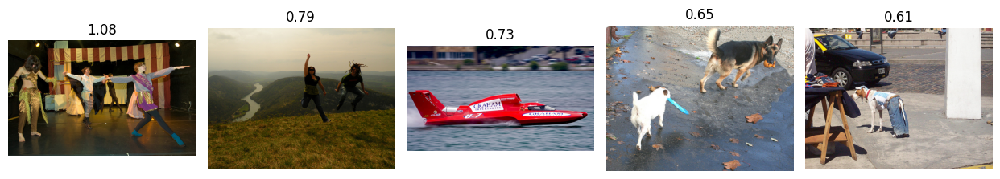


ВАШ ЗАПРОС: two man kickbox in a ring one man punch the other



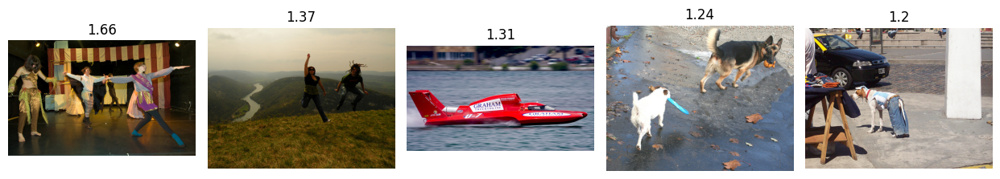


ВАШ ЗАПРОС: a group of people play instrument in the wood



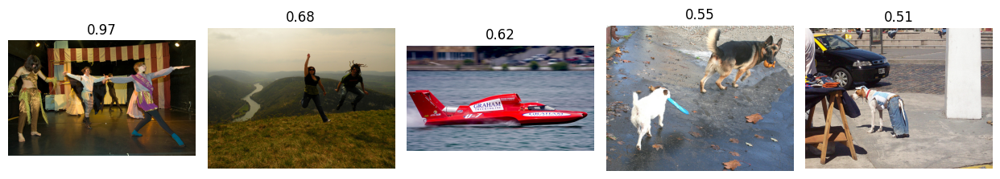


ВАШ ЗАПРОС: a snowboarder wear red be descend a snow cover mountain



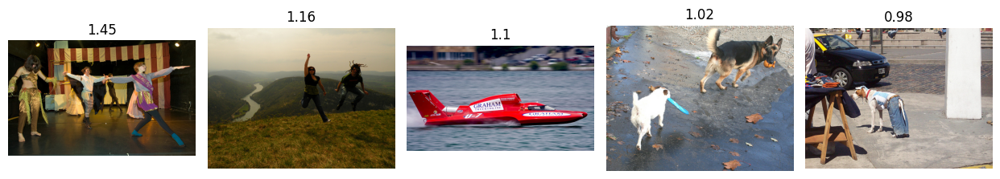


ВАШ ЗАПРОС: a brown and white dog walk in the snow with a big chunk of snow in his mouth



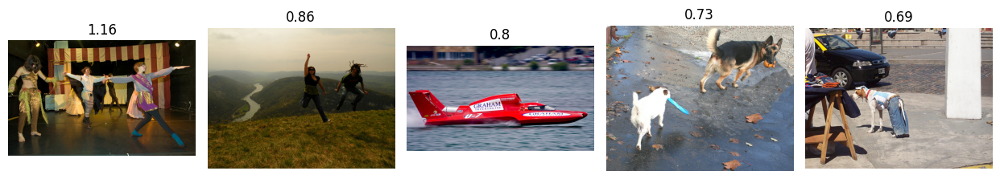


ВАШ ЗАПРОС: the person wear short and a shirt be jump off a dock into the water



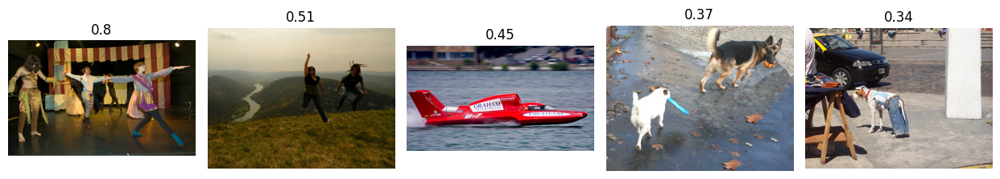


ВАШ ЗАПРОС: a watercraft speed through the water



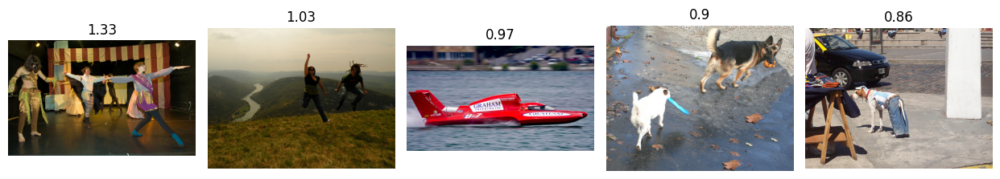


ВАШ ЗАПРОС: a black dog jump into the air to get a treat from its owner



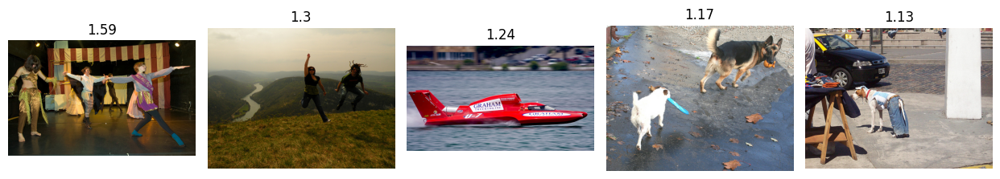


ВАШ ЗАПРОС: a little girl waist high in sand



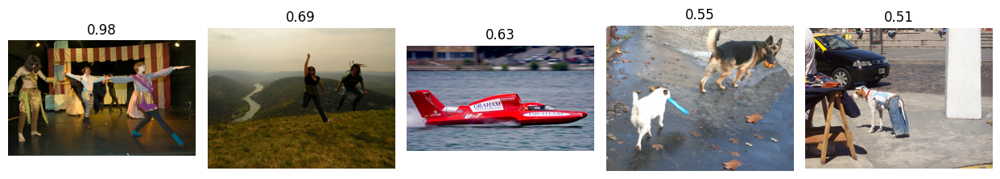

In [56]:
display_images_lin(
    test_queries.query_text,
    '/content/to_upload/test_images/'
)

### Sequential

In [57]:
from tensorflow.keras.models import load_model

# Основная функция обработки и отображения изображений
def display_images_nn(text_list, PATCH_IMAGES):
    """
    Объединённая функция для выбора случайных текстов, проверки на ограничения 
    и отображения изображений по запросу.
    text_list (pd.Series или list): список или серия текстовых запросов.
    PATCH_IMAGES (str or Path): путь к папке с изображениями.
    """

    # 1. Выбираем 10 случайных образцов из текста
    sample_texts = pd.Series(text_list).sample(n=10).reset_index(drop=True)

    # 2. Лемматизация образцов параллельно
    with ProcessPoolExecutor() as executor:
        lemmatized_texts = list(executor.map(lemmatize_text, sample_texts))

    # 3. Проверка на юридические ограничения
    bag_words = set(bag_word_lim)
    clean_texts = []

    for idx, text in enumerate(lemmatized_texts, start=1):
        words = set(text.split())
        if words.intersection(bag_words):
            print(f"Изображение №{idx} недоступно в вашей стране\
            в соответствии с местным законодательством.")
        else:
            clean_texts.append(text)

    # 4. Обработка каждого чистого текста
    for text in clean_texts:
        # Получаем векторное представление текста
        text_embed = get_vector_text(text)

        # Комбинируем векторы изображений и текста
        test_images['combined_vector'] = (
            test_images['image_vector']
            .apply(lambda x: np.concatenate((x, text_embed)))
        )

        # Загружаем уже обученную модель
        nn_model = load_model('my_model.keras')

        # Прогоняем нейронную сеть на каждом запросе для оценки изображений
        predictions = nn_model.predict(
            np.array(test_images['combined_vector'].tolist())
        )

        # Добавляем прогнозы обратно в датафрейм
        test_images['predictions'] = predictions

        # Отбираем верхние 5 изображений по оценке
        top_df = test_images.sort_values(
            by='predictions', 
            ascending=False
        ).head(5)

        # Получаем имена файлов и оценки верхних изображений
        top_images = list(top_df['image'])
        top_scores = list(top_df['predictions'])

        # Выводим запрос и изображения
        print('\nВаш запрос:', text)
        print('')

        # Рисуем графику с лучшими изображениями
        fig = plt.figure(figsize=(15, 5))

        # Настройки внешнего вида осей
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0

        # Выводим изображения
        for i in range(len(top_images)):
            fig.add_subplot(1, 6, i + 1, title=round(float(top_scores[i]), 2))
            image_path = Path(PATCH_IMAGES) / top_images[i]
            image = Image.open(image_path)
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])

        plt.tight_layout()
        plt.show()

Изображение №1 недоступно в вашей стране в соответствии с местным законодательством.
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

Ваш запрос: a man who be dress like a wrestler walk while people take his picture



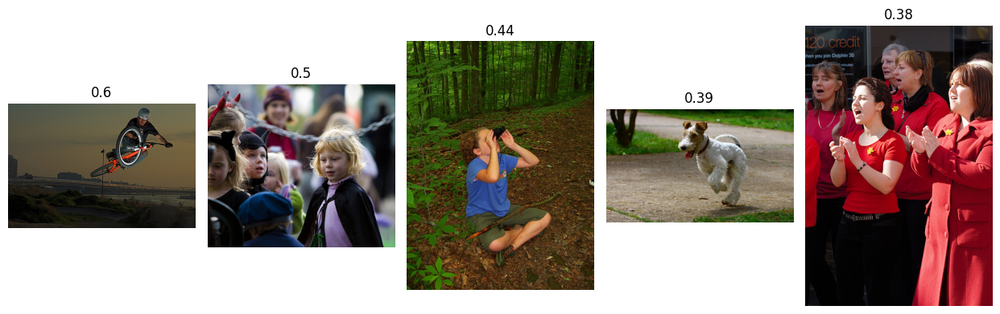

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

Ваш запрос: the man in the black shirt be point his camera at the arena



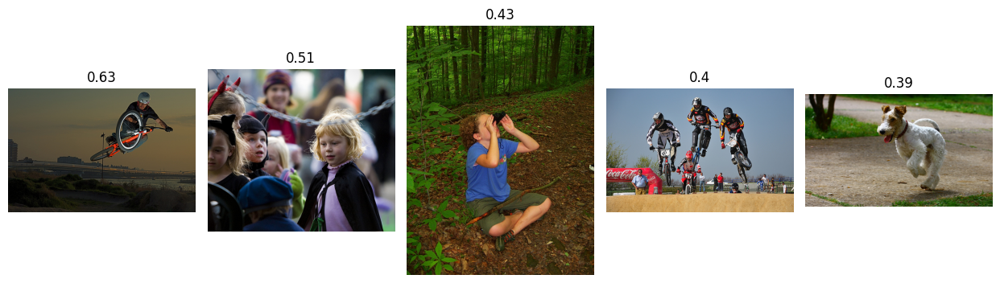

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

Ваш запрос: a watercraft speed through the water



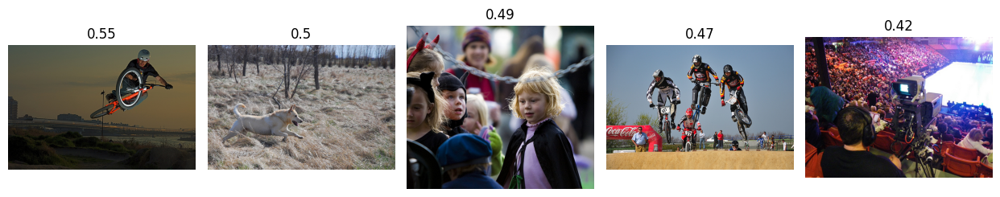

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

Ваш запрос: the brown dog be wear a black collar



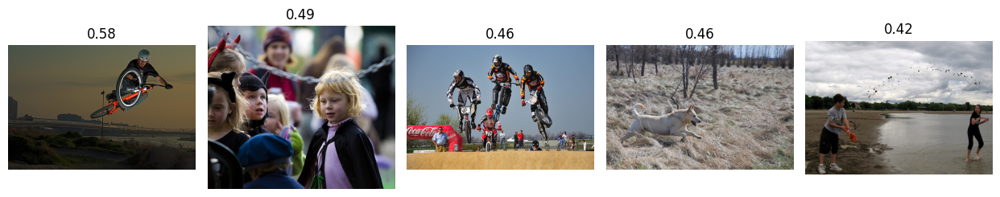

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

Ваш запрос: five woman in red shirt clap



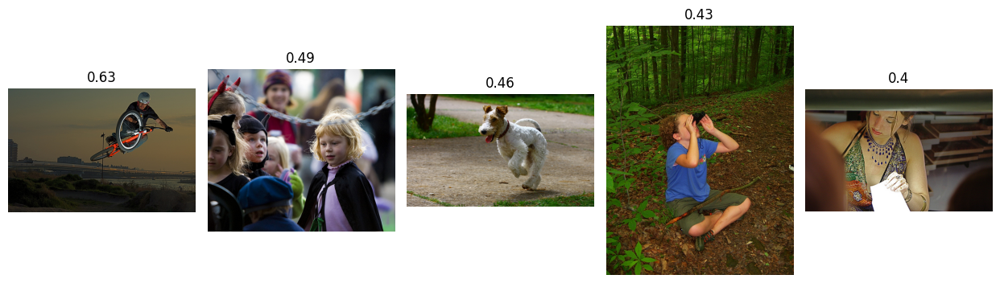

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

Ваш запрос: two dog fight over a toy in the snow



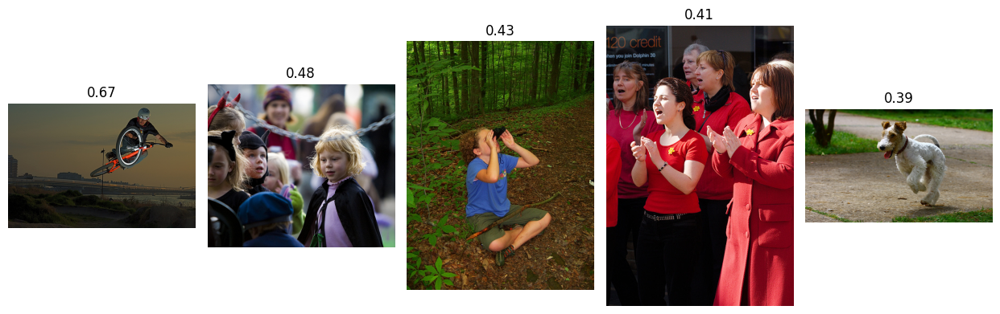

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

Ваш запрос: two boy in swimsuit stand under run water



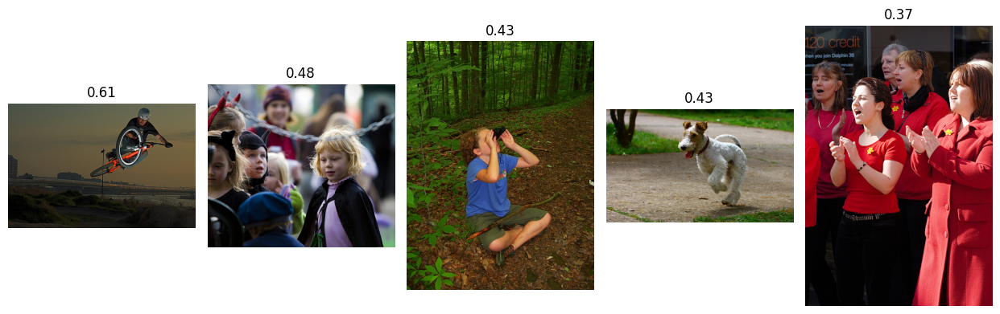

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

Ваш запрос: a guy and a girl jump up in the air



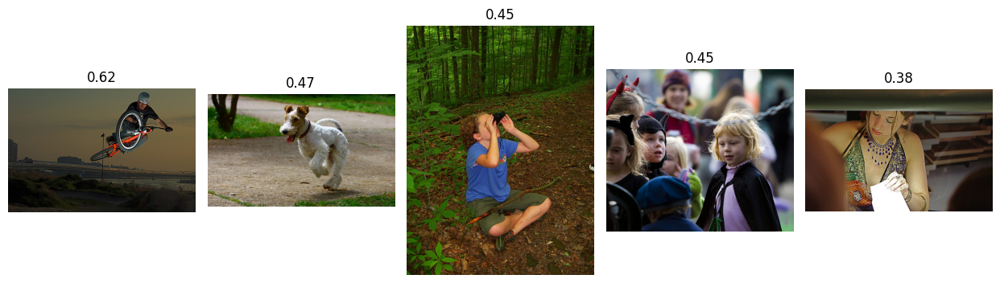

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Ваш запрос: a caramel color dog sit in front of tree look forward



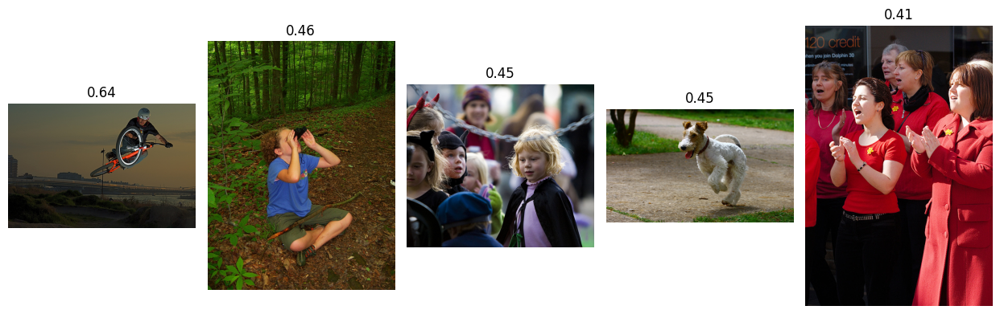

In [58]:
# Запуск функции
display_images_nn(
    test_queries.query_text,
    '/content/to_upload/test_images/'
)

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

**ВЫВОД**

1. **Исследовательский анализ.** Загрузили данные по ссылке и распаковали их архива. При просмотре данных они соответствуют техническому заданию и признаковому описанию.  Так же выделили оценки в экспертном датасете методом голосовании. Далее объединили их с удсординговыми для учета всех источников доверия. В итоге получили 1559 положительно оцененных пар с соответствием текст запроса - картинка и 4263 отрицательных оценок.
2. **Проверка данных.** Создали мешок слов, относящихся к запрету ранжирования изображений с детьми на основе местного законодательства. Далее лемматизировали мешок, текстовые запросы и фильтровали тренировочные данные. На выходе получили 5272 строк, что меньше на 10% от исходного количества образцов. Данный показатель находится в приемлемых рамках потери данных при предобработке.
3. **Векторизация текста.** Применили векторизацию текста запросов с использованием трансформера `BERT`,  разработанного Google. Получив при этом длину вектора запроса 768.
4. **Векторизация изображений.** Для векторизации изображений используем сверточную сеть `ResNet50`, предварительно обученную на наборе данных `ImageNet` с отключенными полносвязными слоями по предсказанию, так как нам это не нужно. Предварительно загрузили изображения с помощью генератора `ImageDataGenerator`
5. **Объединение векторов.** Следующим этапом объединили векторы изображений, длина 2048 и векторы текстов, длина 768. Общая размер 2816.
6. **Обучение модели предсказания соответствия.** Создали модель, которая покажет близость двух векторов. Остановились на метрике `RMSE`, она дает понятное представление о среднем отклонении предсказаний от истинных значений. Метрика в тех же единицах измерения, что и целевая переменная. Далее обучили `LinearRegression` с значением метрики на кросс-валидации 0.81 и `Sequential` с значением метрики на кросс-валидации 0.45.
7. **Тестирование модели.** Написали функцию, которая принимает на вход текстовое описание, делает его векторизацию и возвращает картинку с максимальным значением метрики. Для этого получили векторы для всех тестовых изображений с помощью генератора `test_gen_flow`, выбрали случайные 10 запросов из файла `test_queries` и для каждого запроса вывели наиболее релевантное изображение. Не смотря на более высокую метрику у `LinearRegression` ее результат не удовлетворительный. При анализе результатов запрос вообще не соответствует изображению, на лицо переобучение. С другой стороны у `Sequential` с низким значением метрики результат от части соответствует запросу.